### **Outline**

1. Import Moduls

2. Create the file structure

    a. Field

    b. Warehouse

3. Model building field

    a. CNN-basic

    b. Data Augmentation

    c. Learning rate 

    d. De-freeze 1 layer (best model)

    e. De-freeze 2 layers 

4. Model building warehouse

    a. CNN-basic

    b. Data Augmentation

    c. Learning rate 

    d. De-freeze 1 layer (best model)

5. Model evalution 

    a. field
    
    b. warehouse


### 1. Import modules & functions

In [1]:
def plot_loss_curves(history):
    
    train_loss=history.history['loss']
    val_loss=history.history['val_loss']

    train_accuracy=history.history['acc']
    val_accuracy=history.history['val_acc']

    epochs=range(1,len(history.history['loss'])+1)
    plt.figure(figsize=(20,7))
    
  # plot loss 
    plt.subplot(1,2,1)
    plt.plot(epochs,train_loss,label="training_loss")
    plt.plot(epochs,val_loss,label="validation_loss")
    plt.title("Loss curves")
    plt.xlabel('epochs')
    plt.ylabel('loss')
    plt.legend()

  # plot accuracy 
    plt.subplot(1,2,2)
    plt.plot(epochs,train_accuracy,label="training_acc")
    plt.plot(epochs,val_accuracy,label="validation_acc")
    plt.title("Accuracy curves")
    plt.xlabel('epochs')
    plt.ylabel('Accuracy')
    plt.legend()

In [2]:
def evaluation_results(results):
    for name ,result in results.items():
        print('Model Name: ',name,'\n')
        print('Loss: {} \tAccuracy: {}\n'.format(result[0], result[1]))

evaluation_results_collection = {}

In [3]:
import os, shutil
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf

from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras import optimizers
from tensorflow.keras.models import load_model

### 2. Create the file structure and import data

##### a. field

In [4]:
#after you saved the folder in your current directory, specify its path:
original_dataset_dir = "./Fotos Pito - Students"

original_good_leafs_field = os.path.join(original_dataset_dir, 'Field/Good leafs field')
original_green_leafs_field = os.path.join(original_dataset_dir, 'Field/Green leafs field')
original_spot_leafs_field = os.path.join(original_dataset_dir, 'Field/Spots leafs field')

In [5]:
def naming(category, directory):
    import os

    # Loop through the files in the original directory and find the maximum index used for the category
    max_index = 0
    for filename in os.listdir(directory):
        if filename.startswith(category + '.'):
            index = int(filename.split('.')[1])
            max_index = max(max_index, index)

    # Start renaming files using the next available index
    for i, filename in enumerate(os.listdir(directory)):
        if not filename.startswith(category + '.'):
            # Define the new filename using the category and the index
            new_filename = category + '.' + str(max_index + i + 1) + '.' + filename.split('.')[-1]
            
            # Rename the file with the new filename if it doesn't already exist
            if not os.path.exists(os.path.join(directory, new_filename)):
                os.rename(os.path.join(directory, filename), os.path.join(directory, new_filename))


naming ("good_field", original_good_leafs_field)
naming ("green_field", original_green_leafs_field)
naming ("spots_field", original_spot_leafs_field)

In [6]:
import os
import shutil

# Define the path to the new folder
field_path = './field_data'

# Create the new folder if it doesn't already exist
if not os.path.exists(field_path):
    os.mkdir(field_path)

# Define the paths to the three input folders

# Loop through the files in each input folder and move them to the new folder
for filename in os.listdir(original_good_leafs_field ):
    source_path = os.path.join(original_good_leafs_field , filename)
    dest_path = os.path.join(field_path , filename)
    shutil.copy(source_path, dest_path)

for filename in os.listdir(original_green_leafs_field ):
    source_path = os.path.join(original_green_leafs_field , filename)
    dest_path = os.path.join(field_path , filename)
    shutil.copy(source_path, dest_path)

for filename in os.listdir(original_spot_leafs_field):
    source_path = os.path.join(original_spot_leafs_field, filename)
    dest_path = os.path.join(field_path, filename)
    shutil.copy(source_path, dest_path)


# Get the list of elements in the folder
folder_contents = os.listdir(field_path )

# Get the number of elements in the folder
num_elements = len(folder_contents)

print(f"The folder {field_path } contains {num_elements} elements.")

The folder ./field_data contains 326 elements.


In [7]:
original_train_field_dir = './field_data'

# get label Name   
def get_Label(number):
    labels = {0:'good_field', 1:'green_field', 2: 'spots_field'}
    return labels[number]

# 0 for cat ,1 for dog
all_categories = []
images = os.listdir(original_train_field_dir)
for file in images:
    if file.split('.')[0] == 'good_field':
        all_categories.append(0)
    elif file.split('.')[0] == 'green_field':
        all_categories.append(1)
    else:
        all_categories.append(2)
#creat data fram to save each image with its label 
df = pd.DataFrame({
    'image': images,
    'category':all_categories})

df.head()

,image,category
0,good_field.1.jpg,0
1,good_field.10.jpg,0
2,good_field.100.jpg,0
3,good_field.101.jpg,0
4,good_field.102.jpg,0


In [8]:
print("Label-File: "  + str(len(df.loc[df['category'] == 0])))
print("Label-File: "  + str(len(df.loc[df['category'] == 1])))
print("Label-File: "  + str(len(df.loc[df['category'] == 2])))

Label-File: 104
Label-File: 119
Label-File: 103


In [9]:
#This is where we will store the images that have been split:
base_field_dir = "./field_split"

train_field_dir = os.path.join(base_field_dir, 'train')
test_field_dir = os.path.join(base_field_dir, 'test')
validate_field_dir = os.path.join(base_field_dir, 'validate')


for directory in [base_field_dir, train_field_dir, test_field_dir , validate_field_dir]:
    
    if not os.path.exists(directory):

        os.mkdir(directory)
        print(directory, "created")
        

subdirectories_good_field = [] 
subdirectories_green_field = []
subdirectories_spot_field = []


for subdirectory in [train_field_dir, test_field_dir, validate_field_dir]:
    subdirectories_good_field.append(os.path.join(subdirectory, 'good_field'))
    if not os.path.exists(os.path.join(subdirectory, 'good_field')):
        os.mkdir(os.path.join(subdirectory, 'good_field'))
        print(os.path.join(subdirectory, 'good_field'), "created")
        
    subdirectories_green_field.append(os.path.join(subdirectory, 'green_field'))
    if not os.path.exists(os.path.join(subdirectory, 'green_field')):
        os.mkdir(os.path.join(subdirectory, 'green_field'))
        print(os.path.join(subdirectory, 'green_field'), "created")

    subdirectories_spot_field.append(os.path.join(subdirectory, 'spots_field'))
    if not os.path.exists(os.path.join(subdirectory, 'spots_field')):
        os.mkdir(os.path.join(subdirectory, 'spots_field'))
        print(os.path.join(subdirectory, 'spots_field'), "created")


./field_split created
./field_split\train created
./field_split\test created
./field_split\validate created
./field_split\train\good_field created
./field_split\train\green_field created
./field_split\train\spots_field created
./field_split\test\good_field created
./field_split\test\green_field created
./field_split\test\spots_field created
./field_split\validate\good_field created
./field_split\validate\green_field created
./field_split\validate\spots_field created


In [111]:
import random

# list all the images in the original train directory
images = os.listdir(original_train_field_dir)

# create separate lists of images for each class
class1_images = [img for img in images if img.startswith('good_field')]
class2_images = [img for img in images if img.startswith('green_field')]
class3_images = [img for img in images if img.startswith('spots_field')]

# find the minimum number of images among the classes
min_class_images = min(len(class1_images), len(class2_images), len(class3_images))

# randomly select min_class_images images from each class
class1_images_sampled = random.sample(class1_images, min_class_images)
class2_images_sampled = random.sample(class2_images, min_class_images)
class3_images_sampled = random.sample(class3_images, min_class_images)

# update the image lists for each class to only include the sampled images
class1_images = class1_images_sampled
class2_images = class2_images_sampled
class3_images = class3_images_sampled

# concatenate the sampled images from each class
images_sampled = class1_images + class2_images + class3_images

# create labels for the sampled images
labels_sampled = ['class1'] * min_class_images + ['class2'] * min_class_images + ['class3'] * min_class_images

# split the sampled images into train, test, and validation sets
x_train, x_test1, y_train, y_test1 = train_test_split(images_sampled, labels_sampled, test_size=0.2, random_state=42)
x_test, x_val, y_test, y_val = train_test_split(x_test1, y_test1, test_size=0.66, random_state=42)

print('Training data set size :', len(y_train))
print('Test data set size :', len(y_test))
print('Validation data set size :', len(y_val))


Training data set size : 247
Test data set size : 21
Validation data set size : 41


In [11]:
for ix, images in enumerate([x_train, x_test, x_val]):
    for file in images:
        if file.split('.')[0] == 'good_field':
            src = os.path.join(original_train_field_dir, file)
            dst = os.path.join(subdirectories_good_field[ix], file)
            shutil.copyfile(src, dst)
        
        elif file.split('.')[0] == 'green_field':
            src = os.path.join(original_train_field_dir, file)
            dst = os.path.join(subdirectories_green_field[ix], file)
            shutil.copyfile(src, dst)

        else:
            src = os.path.join(original_train_field_dir, file)
            dst = os.path.join(subdirectories_spot_field[ix], file)
            shutil.copyfile(src, dst)

    print(len(os.listdir(subdirectories_good_field[ix])), " good_field copied to:", subdirectories_good_field[ix])
    print(len(os.listdir(subdirectories_green_field[ix])), " green_field copied to:", subdirectories_green_field[ix])
    print(len(os.listdir(subdirectories_spot_field[ix])), " spot_field copied to:", subdirectories_spot_field[ix])

80  good_field copied to: ./field_split\train\good_field
83  green_field copied to: ./field_split\train\green_field
84  spot_field copied to: ./field_split\train\spots_field
6  good_field copied to: ./field_split\test\good_field
8  green_field copied to: ./field_split\test\green_field
7  spot_field copied to: ./field_split\test\spots_field
17  good_field copied to: ./field_split\validate\good_field
12  green_field copied to: ./field_split\validate\green_field
12  spot_field copied to: ./field_split\validate\spots_field


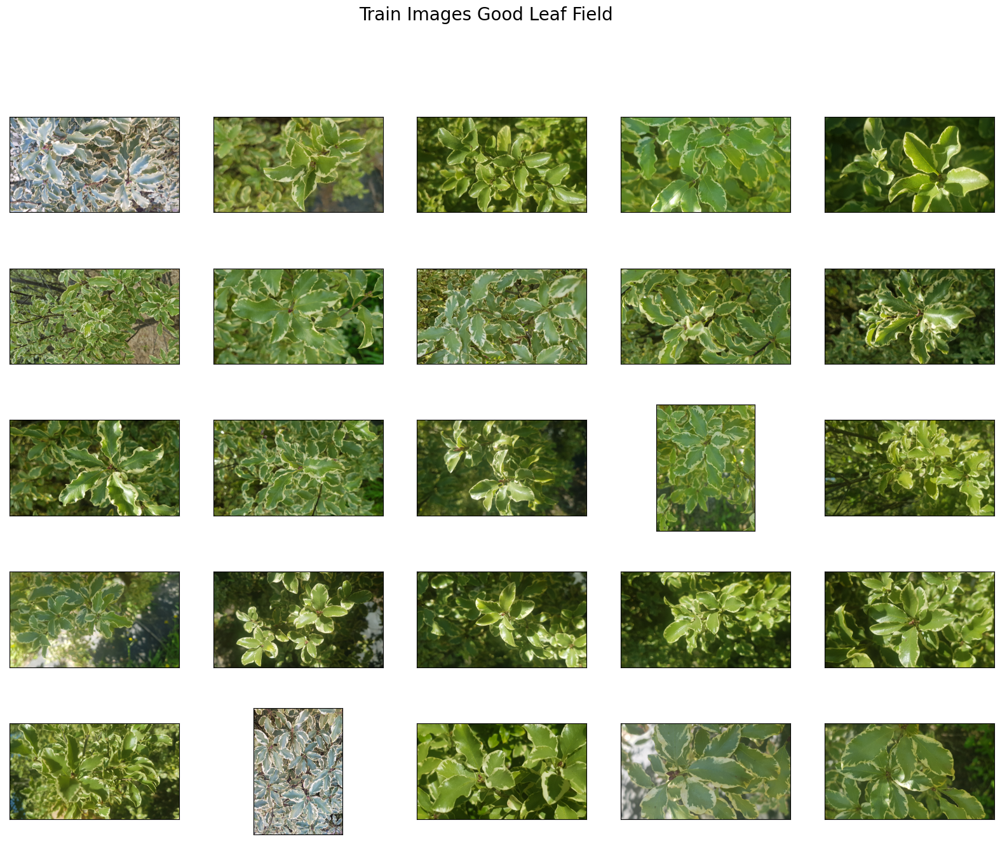

In [35]:
plt.figure(figsize=(20,15))
plt.suptitle("Train Images Good Leaf Field", fontsize=20)
counter =0

for i,img in enumerate(os.listdir(subdirectories_good_field[0]))  :
        plt.subplot(5,5,i+1)

        full_image= plt.imread(os.path.join(original_train_field_dir,img))
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(full_image, cmap=plt.cm.binary) 
        if i == 24:
            break

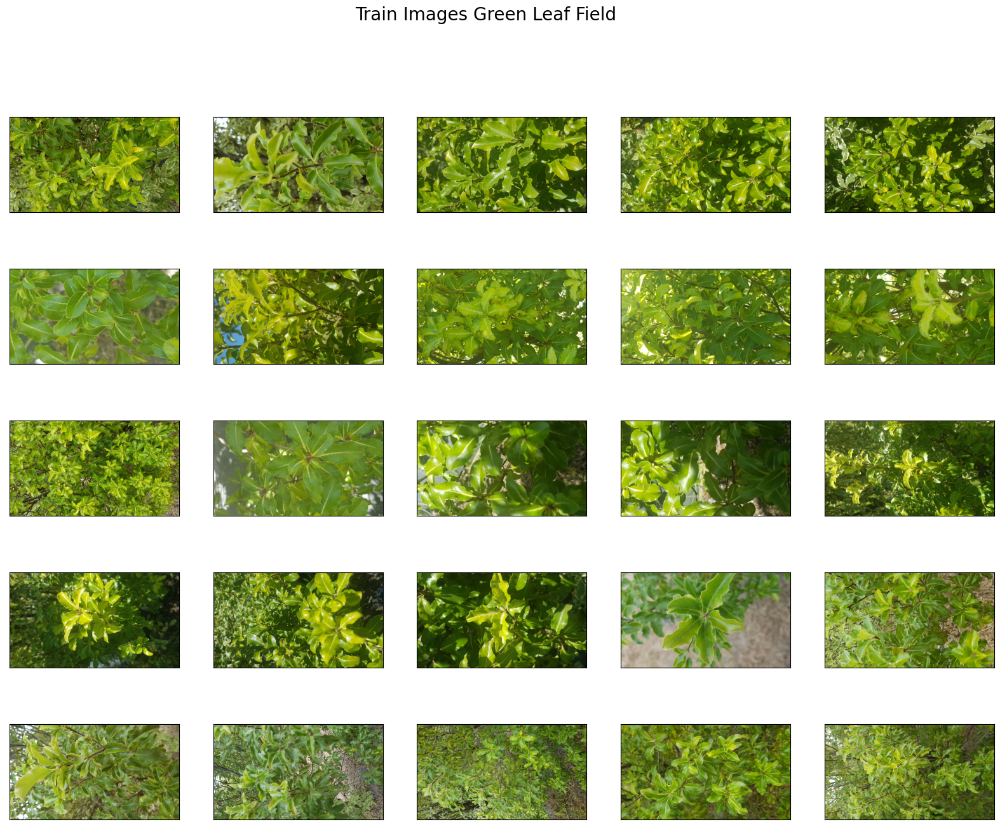

In [16]:
plt.figure(figsize=(20,15))
plt.suptitle("Train Images Green Leaf Field", fontsize=20)
counter =0

for i,img in enumerate(os.listdir(subdirectories_green_field[0]))  :
        plt.subplot(5,5,i+1)

        full_image= plt.imread(os.path.join(original_train_field_dir,img))
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(full_image, cmap=plt.cm.binary) 
        if i == 24:
            break

##### b. warehouse

In [105]:
original_good_leafs_warehouse = os.path.join(original_dataset_dir, 'Warehouse\Good Leafs Warehouse - Bag')
original_spots_leafs_warehouse = os.path.join(original_dataset_dir, 'Warehouse\Spots Leafs Warehouse - Bag')

In [106]:
def naming(category, directory):
    import os

    # Loop through the files in the original directory and find the maximum index used for the category
    max_index = 0
    for filename in os.listdir(directory):
        if filename.startswith(category + '.'):
            index = int(filename.split('.')[1])
            max_index = max(max_index, index)

    # Start renaming files using the next available index
    for i, filename in enumerate(os.listdir(directory)):
        if not filename.startswith(category + '.'):
            # Define the new filename using the category and the index
            new_filename = category + '.' + str(max_index + i + 1) + '.' + filename.split('.')[-1]
            
            # Rename the file with the new filename if it doesn't already exist
            if not os.path.exists(os.path.join(directory, new_filename)):
                os.rename(os.path.join(directory, filename), os.path.join(directory, new_filename))


naming ("good_warehouse", original_good_leafs_warehouse)
naming ("spots_warehouse", original_spots_leafs_warehouse)

In [107]:
import os
import shutil

# Define the path to the new folder
warehouse_path = './warehouse_data'

# Create the new folder if it doesn't already exist
if not os.path.exists(warehouse_path):
    os.mkdir(warehouse_path)

# Define the paths to the three input folders

# Loop through the files in each input folder and move them to the new folder
for filename in os.listdir(original_good_leafs_warehouse):
    source_path = os.path.join(original_good_leafs_warehouse , filename)
    dest_path = os.path.join(warehouse_path, filename)
    shutil.copy(source_path, dest_path)

for filename in os.listdir(original_spots_leafs_warehouse):
    source_path = os.path.join(original_spots_leafs_warehouse, filename)
    dest_path = os.path.join(warehouse_path , filename)
    shutil.copy(source_path, dest_path)

# Get the list of elements in the folder
folder_contents = os.listdir(warehouse_path)

# Get the number of elements in the folder
num_elements = len(folder_contents)

print(f"The folder {warehouse_path } contains {num_elements} elements.")

The folder ./warehouse_data contains 414 elements.


In [108]:
original_train_warehouse_dir = './warehouse_data'

# get label Name   
def get_Label(number):
    labels = {0:'good_warehouse', 1:'spots_warehouse'}
    return labels[number]

all_categories = []
images = os.listdir(original_train_warehouse_dir)
for file in images:
    if file.split('.')[0] == 'good_warehouse':
        all_categories.append(0)
    else:
        all_categories.append(1)
#creat data fram to save each image with its label 
df = pd.DataFrame({
    'image': images,
    'category':all_categories})

df.head()
df.tail()

,image,category
409,spots_warehouse.95.jpg,1
410,spots_warehouse.96.jpg,1
411,spots_warehouse.97.jpg,1
412,spots_warehouse.98.jpg,1
413,spots_warehouse.99.jpg,1


In [109]:
print("Label-File: "  + str(len(df.loc[df['category'] == 0])))
print("Label-File: "  + str(len(df.loc[df['category'] == 1])))

Label-File: 80
Label-File: 334


In [112]:
#This is where we will store the images that have been split:
base_warehouse_dir = "./warehouse_split"

train_warehouse_dir = os.path.join(base_warehouse_dir, 'train')
test_warehouse_dir = os.path.join(base_warehouse_dir, 'test')
validate_warehouse_dir = os.path.join(base_warehouse_dir, 'validate')


for directory in [base_warehouse_dir, train_warehouse_dir, test_warehouse_dir, validate_warehouse_dir]:
    
    if not os.path.exists(directory):

        os.mkdir(directory)
        print(directory, "created")
        

subdirectories_good_warehouse = [] 
subdirectories_spots_warehouse = []


for subdirectory in [train_warehouse_dir, test_warehouse_dir, validate_warehouse_dir]:
    subdirectories_good_warehouse.append(os.path.join(subdirectory, 'good_warehouse'))
    if not os.path.exists(os.path.join(subdirectory, 'good_warehouse')):
        os.mkdir(os.path.join(subdirectory, 'good_warehouse'))
        print(os.path.join(subdirectory, 'good_warehouse'), "created")
        
    subdirectories_spots_warehouse.append(os.path.join(subdirectory, 'spots_warehouse'))
    if not os.path.exists(os.path.join(subdirectory, 'spots_warehouse')):
        os.mkdir(os.path.join(subdirectory, 'spots_warehouse'))
        print(os.path.join(subdirectory, 'spots_warehouse'), "created")

./warehouse_split created
./warehouse_split\train created
./warehouse_split\test created
./warehouse_split\validate created
./warehouse_split\train\good_warehouse created
./warehouse_split\train\spots_warehouse created
./warehouse_split\test\good_warehouse created
./warehouse_split\test\spots_warehouse created
./warehouse_split\validate\good_warehouse created
./warehouse_split\validate\spots_warehouse created


In [115]:
images = os.listdir(original_train_warehouse_dir)
# taking 80% as train data 
x_train, x_test1, y_train, y_test1 = train_test_split(images, df["category"] ,test_size=0.2, random_state=42)

# from 20% data, splitting 50% as test data and 50% as validation data
x_test, x_val, y_test, y_val = train_test_split(x_test1, y_test1 ,test_size=0.5, random_state=42)

print('Training data set size :', y_train.shape[0])
print('Test data set size :', y_test.shape[0])
print('Validation data set size :', y_val.shape[0])

Training data set size : 331
Test data set size : 41
Validation data set size : 42


In [116]:
for ix, images in enumerate([x_train, x_test, x_val]):
    for file in images:
        if file.split('.')[0] == 'good_warehouse':
            src = os.path.join(original_train_warehouse_dir, file)
            dst = os.path.join(subdirectories_good_warehouse[ix], file)
            shutil.copyfile(src, dst)

        else:
            src = os.path.join(original_train_warehouse_dir, file)
            dst = os.path.join(subdirectories_spots_warehouse[ix], file)
            shutil.copyfile(src, dst)

    print(len(os.listdir(subdirectories_good_warehouse[ix])), " good_warehouse copied to:", subdirectories_good_warehouse[ix])
    print(len(os.listdir(subdirectories_spots_warehouse[ix])), " spot_warehouse copied to:", subdirectories_spots_warehouse[ix])

57  good_warehouse copied to: ./warehouse_split\train\good_warehouse
274  spot_warehouse copied to: ./warehouse_split\train\spots_warehouse
6  good_warehouse copied to: ./warehouse_split\test\good_warehouse
35  spot_warehouse copied to: ./warehouse_split\test\spots_warehouse
17  good_warehouse copied to: ./warehouse_split\validate\good_warehouse
25  spot_warehouse copied to: ./warehouse_split\validate\spots_warehouse


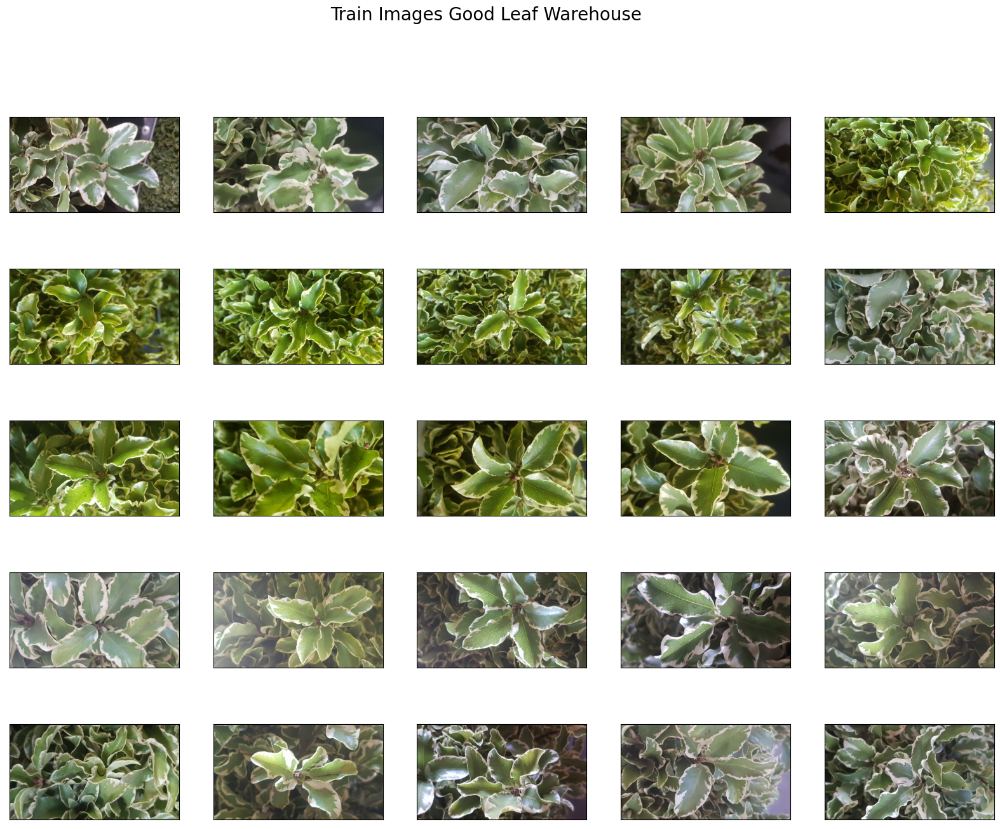

In [117]:
plt.figure(figsize=(20,15))
plt.suptitle("Train Images Good Leaf Warehouse", fontsize=20)
counter =0

for i,img in enumerate(os.listdir(subdirectories_good_warehouse[0]))  :
        plt.subplot(5,5,i+1)

        full_image= plt.imread(os.path.join(original_train_warehouse_dir,img))
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(full_image, cmap=plt.cm.binary) 
        if i == 24:
            break

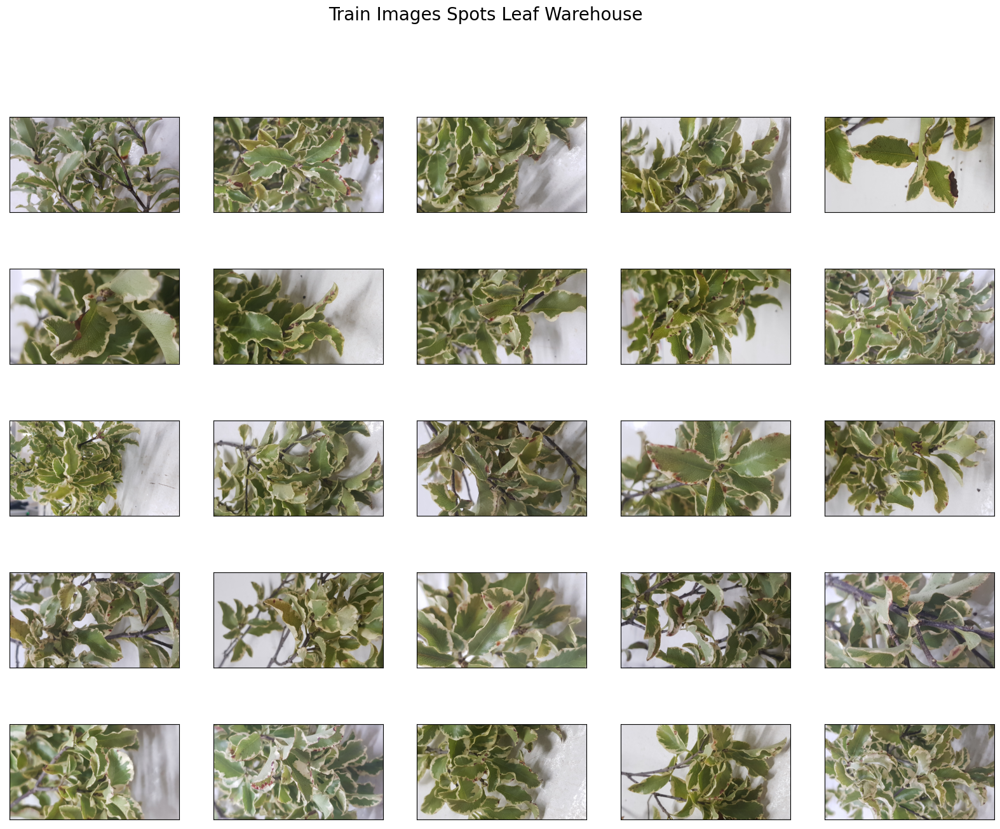

In [26]:
plt.figure(figsize=(20,15))
plt.suptitle("Train Images Spots Leaf Warehouse", fontsize=20)
counter =0

for i,img in enumerate(os.listdir(subdirectories_spots_warehouse[0]))  :
        plt.subplot(5,5,i+1)

        full_image= plt.imread(os.path.join(original_train_warehouse_dir,img))
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(full_image, cmap=plt.cm.binary) 
        if i == 24:
            break

### 3. Model buidling field

In [118]:
# Define the folder path where you want to save the model
folder_path = 'field_model/'

# Create the folder if it does not exist
if not os.path.exists(folder_path):
    os.makedirs(folder_path)

evaluation_results_field= {}

In [119]:
from keras.models import Sequential
from keras.layers import Dense
from keras.callbacks import Callback, ModelCheckpoint

class MyCallback(Callback):
    def on_epoch_end(self, epoch, logs=None):
        # do something at the end of each epoch
        print("End of epoch:", epoch)
        print("Accuracy:", logs["accuracy"])
        
    def on_train_end(self, logs=None):
        # do something at the end of the training process
        print("Training ended")

##### a. CNN-basic

In [48]:
from tensorflow.keras.callbacks import EarlyStopping

train_datagen = ImageDataGenerator(
      rescale=1./255,
      #rotation_range=15,
      #width_shift_range=0.12,
      #height_shift_range=0.12,
      #shear_range=0.1,
      #zoom_range=0.1,
      #zoom_range=[0.9,1.1],
      #brightness_range = [0.8, 1.2],
      #horizontal_flip=True,
      #fill_mode='nearest'
      )

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_field_dir,
        target_size=(180, 180),
        batch_size=30,     # sampling size in each group 
        classes = ['good_field', 'green_field', 'spots_field'],
        class_mode='categorical')


validation_generator = test_datagen.flow_from_directory(
        validate_field_dir,
        target_size=(180, 180),
        batch_size=30,
        classes = ['good_field', 'green_field', 'spots_field'],
        class_mode='categorical')

basic_model = models.Sequential()
basic_model.add(layers.Conv2D(32, (3, 3), activation='relu',
                        input_shape=(180, 180, 3)))
basic_model.add(layers.MaxPooling2D((2, 2)))
basic_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
basic_model.add(layers.MaxPooling2D((2, 2)))
basic_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
basic_model.add(layers.MaxPooling2D((2, 2)))
basic_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
basic_model.add(layers.MaxPooling2D((2, 2)))
basic_model.add(layers.Flatten())
basic_model.add(layers.Dense(512, activation='relu'))
basic_model.add(layers.Dropout(0.1))
basic_model.add(layers.Dense(3, activation='softmax'))

basic_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(learning_rate=1e-4),
              metrics=['acc'])

# number of samples in the training and validation sets
train_samples = len(train_generator.filenames)
val_samples = len(validation_generator.filenames)

# Set the batch size
batch_size = 30

# Calculation of the the steps per epoch and validation steps
steps_per_epoch = train_samples // batch_size
validation_steps = val_samples // batch_size

# Define the folder path where you want to save the model
model_path = 'field_model/'

checkpoint_path = os.path.join(model_path, 'checkpoint_basic_model.h5')

early_stop = EarlyStopping(monitor='val_acc', patience=10)

# Train the model
checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_acc', verbose=1, save_best_only=True, mode='max')

# Train the model with the callback
history_basic_model = basic_model.fit(
    train_generator,
    steps_per_epoch=steps_per_epoch,
    epochs=30,
    validation_data=validation_generator,
    validation_steps=validation_steps,
    callbacks=[checkpoint, early_stop]
)

Found 247 images belonging to 3 classes.
Found 41 images belonging to 3 classes.
Epoch 1/30
8/8 [==============================] - ETA: 0s - loss: 1.0857 - acc: 0.3871
Epoch 1: val_acc improved from -inf to 0.30000, saving model to field_model\checkpoint_basic_model.h5
8/8 [==============================] - 35s 4s/step - loss: 1.0857 - acc: 0.3871 - val_loss: 1.0607 - val_acc: 0.3000
Epoch 2/30
8/8 [==============================] - ETA: 0s - loss: 0.9549 - acc: 0.5622
Epoch 2: val_acc improved from 0.30000 to 0.43333, saving model to field_model\checkpoint_basic_model.h5
8/8 [==============================] - 31s 4s/step - loss: 0.9549 - acc: 0.5622 - val_loss: 1.0914 - val_acc: 0.4333
Epoch 3/30
8/8 [==============================] - ETA: 0s - loss: 0.8902 - acc: 0.5438
Epoch 3: val_acc improved from 0.43333 to 0.50000, saving model to field_model\checkpoint_basic_model.h5
8/8 [==============================] - 30s 4s/step - loss: 0.8902 - acc: 0.5438 - val_loss: 0.8495 - val_acc: 0.

In [49]:
for data_batch, labels_batch in train_generator:
    print('data batch shape:', data_batch.shape)
    print('labels batch shape:', labels_batch.shape)
    break

data batch shape: (30, 180, 180, 3)
labels batch shape: (30, 3)


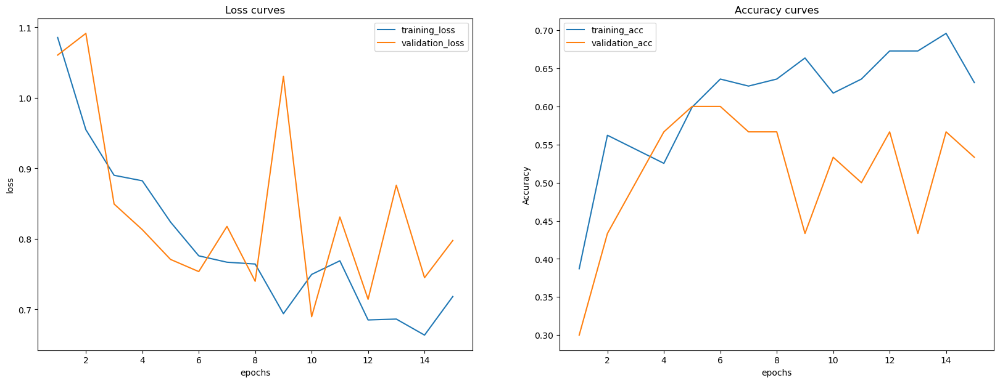

In [50]:
plot_loss_curves(history_basic_model)

In [51]:
# Save the model in the folder
basic_model.save(os.path.join(folder_path, 'basic_model.h5'))

In [52]:
from tensorflow.keras.models import load_model

model = models.load_model('field_model/basic_model.h5')

# Load the test data using the test_generator
test_generator = test_datagen.flow_from_directory(
    test_field_dir,
    target_size=(180, 180),
    batch_size=30,
    classes = ['good_field', 'green_field', 'spots_field'],
    class_mode='categorical')

# Evaluate the model on the test data
test_loss, test_acc = model.evaluate(test_generator, steps=len(test_generator))
print('Test accuracy:', test_acc)

Found 21 images belonging to 3 classes.
1/1 [==============================] - 3s 3s/step - loss: 0.6879 - acc: 0.6190
Test accuracy: 0.6190476417541504


In [53]:
basic_model_field = (test_loss, test_acc)

evaluation_results_field.update({"basic_model" :basic_model_field})

In [54]:
from tensorflow.keras.models import load_model

model = models.load_model('field_model/checkpoint_basic_model.h5')

# Load the test data using the test_generator
test_generator = test_datagen.flow_from_directory(
    test_field_dir,
    target_size=(180, 180),
    batch_size=30,
    classes = ['good_field', 'green_field', 'spots_field'],
    class_mode='categorical')

# Evaluate the model on the test data
test_loss, test_acc = model.evaluate(test_generator, steps=len(test_generator))
print('Test accuracy:', test_acc)

Found 21 images belonging to 3 classes.
1/1 [==============================] - 2s 2s/step - loss: 0.7645 - acc: 0.6190
Test accuracy: 0.6190476417541504


In [55]:
basic_model_callback = (test_loss, test_acc)

evaluation_results_field.update({"basic_model_callback" :basic_model_callback})

In [56]:
evaluation_results(evaluation_results_field)

Model Name:  basic_model 

Loss: 0.6878840327262878 	Accuracy: 0.6190476417541504

Model Name:  basic_model_callback 

Loss: 0.7645411491394043 	Accuracy: 0.6190476417541504



#### b. Data Augmentation

In [64]:
from tensorflow.keras.callbacks import EarlyStopping

train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=15,
      width_shift_range=0.12,
      height_shift_range=0.12,
      #shear_range=0.1,
      #zoom_range=0.1,
      zoom_range=[0.9,1.1],
      brightness_range = [0.8, 1.2],
      horizontal_flip=True,
      fill_mode='nearest'
      )

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_field_dir,
        target_size=(180, 180),
        batch_size=30,     # sampling size in each group 
        classes = ['good_field', 'green_field', 'spots_field'],
        class_mode='categorical')


validation_generator = test_datagen.flow_from_directory(
        validate_field_dir,
        target_size=(180, 180),
        batch_size= 30,
        classes = ['good_field', 'green_field', 'spots_field'],
        class_mode='categorical')

augment_model_field = models.Sequential()
augment_model_field.add(layers.Conv2D(32, (3, 3), activation='relu',
                        input_shape=(180, 180, 3)))
augment_model_field.add(layers.MaxPooling2D((2, 2)))
augment_model_field.add(layers.Conv2D(64, (3, 3), activation='relu'))
augment_model_field.add(layers.MaxPooling2D((2, 2)))
augment_model_field.add(layers.Conv2D(128, (3, 3), activation='relu'))
augment_model_field.add(layers.MaxPooling2D((2, 2)))
augment_model_field.add(layers.Conv2D(128, (3, 3), activation='relu'))
augment_model_field.add(layers.MaxPooling2D((2, 2)))
augment_model_field.add(layers.Flatten())
augment_model_field.add(layers.Dense(512, activation='relu'))
augment_model_field.add(layers.Dropout(0.1))
augment_model_field.add(layers.Dense(3, activation='softmax'))

augment_model_field.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(learning_rate=1e-4),
              metrics=['acc'])

# number of samples in the training and validation sets
train_samples = len(train_generator.filenames)
val_samples = len(validation_generator.filenames)

# Set the batch size
batch_size = 30

# Calculation of the the steps per epoch and validation steps
steps_per_epoch = train_samples // batch_size
validation_steps = val_samples // batch_size

# Define the folder path where you want to save the model
model_path = 'field_model/'

checkpoint_path = os.path.join(model_path, 'checkpoint_augment_model.h5')

# Train the model
checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_acc', verbose=1, save_best_only=True, mode='max')

# Train the model with the callback
history_augment_model_field = augment_model_field.fit(
    train_generator,
    steps_per_epoch=steps_per_epoch,
    epochs=30,
    validation_data=validation_generator,
    validation_steps=validation_steps,
    callbacks=[checkpoint]
)

Found 247 images belonging to 3 classes.
Found 41 images belonging to 3 classes.
Epoch 1/30
8/8 [==============================] - ETA: 0s - loss: 1.1176 - acc: 0.3226
Epoch 1: val_acc improved from -inf to 0.26667, saving model to field_model\checkpoint_augment_model.h5
8/8 [==============================] - 36s 5s/step - loss: 1.1176 - acc: 0.3226 - val_loss: 1.1296 - val_acc: 0.2667
Epoch 2/30
8/8 [==============================] - ETA: 0s - loss: 1.0842 - acc: 0.4542
Epoch 2: val_acc improved from 0.26667 to 0.40000, saving model to field_model\checkpoint_augment_model.h5
8/8 [==============================] - 42s 6s/step - loss: 1.0842 - acc: 0.4542 - val_loss: 1.0431 - val_acc: 0.4000
Epoch 3/30
8/8 [==============================] - ETA: 0s - loss: 1.0459 - acc: 0.4839
Epoch 3: val_acc did not improve from 0.40000
8/8 [==============================] - 73s 9s/step - loss: 1.0459 - acc: 0.4839 - val_loss: 1.0571 - val_acc: 0.2667
Epoch 4/30
8/8 [==============================] - 

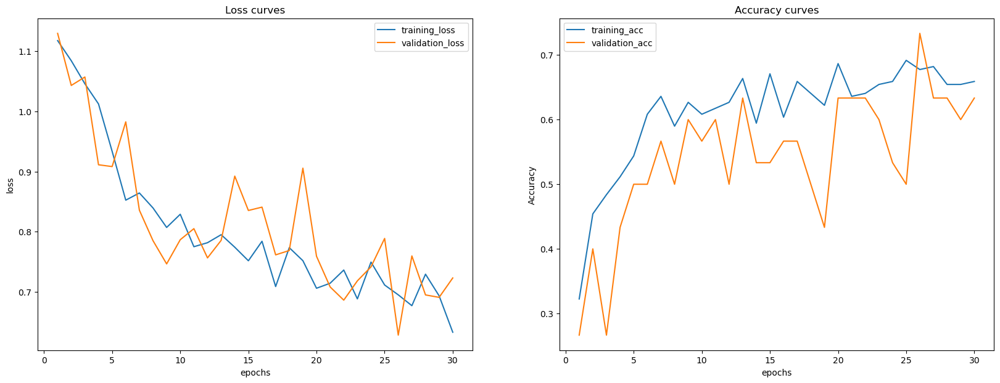

In [65]:
plot_loss_curves(history_augment_model_field)

In [66]:
# Save the model in the folder
augment_model_field.save(os.path.join(model_path, 'augment_model.h5'))

In [70]:
from tensorflow.keras.models import load_model

model = models.load_model('field_model/augment_model.h5')

# Load the test data using the test_generator
test_generator = test_datagen.flow_from_directory(
    test_field_dir,
    target_size=(180, 180),
    batch_size=20,
    classes = ['good_field', 'green_field', 'spots_field'],
    class_mode='categorical')

# Evaluate the model on the test data
test_loss, test_acc = model.evaluate(test_generator, steps=len(test_generator))
print('Test accuracy:', test_acc)

Found 21 images belonging to 3 classes.
2/2 [==============================] - 3s 118ms/step - loss: 0.6669 - acc: 0.7619
Test accuracy: 0.761904776096344


In [71]:
augment_model_field = (test_loss, test_acc)

evaluation_results_field.update({"augment_model" : augment_model_field })

In [74]:
from tensorflow.keras.models import load_model

model = models.load_model('field_model/checkpoint_augment_model.h5')

# Load the test data using the test_generator
test_generator = test_datagen.flow_from_directory(
    test_field_dir,
    target_size=(180, 180),
    batch_size=30,
    classes = ['good_field', 'green_field', 'spots_field'],
    class_mode='categorical')

# Evaluate the model on the test data
test_loss, test_acc = model.evaluate(test_generator, steps=len(test_generator))
print('Test accuracy:', test_acc)

Found 21 images belonging to 3 classes.
1/1 [==============================] - 2s 2s/step - loss: 0.6275 - acc: 0.7619
Test accuracy: 0.761904776096344


In [75]:
augment_model_callback = (test_loss, test_acc)

evaluation_results_field.update({"augment_model_callback" :augment_model_callback})

In [76]:
evaluation_results(evaluation_results_field)

Model Name:  basic_model 

Loss: 0.6878840327262878 	Accuracy: 0.6190476417541504

Model Name:  basic_model_callback 

Loss: 0.7645411491394043 	Accuracy: 0.6190476417541504

Model Name:  augment_model 

Loss: 0.6669044494628906 	Accuracy: 0.761904776096344

Model Name:  augment_model_callback 

Loss: 0.6274863481521606 	Accuracy: 0.761904776096344



#### c. learning rate VGG16

In [86]:
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.applications import VGG16
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator

conv_base = VGG16(weights='imagenet', include_top = False, input_shape = (180,180,3))

VGG16_model_freeze = models.Sequential()
VGG16_model_freeze.add(conv_base)
VGG16_model_freeze.add(layers.Flatten())
VGG16_model_freeze.add(layers.Dense(64, activation='relu'))
VGG16_model_freeze.add(layers.Dense(3, activation='softmax'))

train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=15,
      width_shift_range=0.12,
      height_shift_range=0.12,
      #shear_range=0.1,
      #zoom_range=0.1,
      zoom_range=[0.9,1.1],
      brightness_range = [0.8, 1.2],
      horizontal_flip=True,
      fill_mode='nearest'
      )

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_field_dir,
        target_size=(180, 180),
        batch_size=30,
        class_mode='categorical',
        classes = ['good_field', 'green_field', 'spots_field'])

validation_generator = test_datagen.flow_from_directory(
        validate_field_dir,
        target_size=(180, 180),
        batch_size=30,
        class_mode='categorical',
        classes = ['good_field', 'green_field', 'spots_field'])


conv_base.trainable = False

VGG16_model_freeze.compile(loss='categorical_crossentropy',
              optimizer=Adam(learning_rate=0.00016), #0.00001
              metrics=['acc'])


# number of samples in the training and validation sets
train_samples = len(train_generator.filenames)
val_samples = len(validation_generator.filenames)

# Set the batch size
batch_size = 30

# Calculation of the the steps per epoch and validation steps
steps_per_epoch = train_samples // batch_size
validation_steps = val_samples // batch_size

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the folder path where you want to save the model
model_path = 'field_model/'

checkpoint_path = os.path.join(model_path, 'checkpoint_VGG16_unfreeze_model.h5')

# Train the model
checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_acc', verbose=1, save_best_only=True, mode='max')


# Train the model
history_VGG16_freeze = VGG16_model_freeze.fit(
  train_generator,
  steps_per_epoch=steps_per_epoch,      
  epochs=30,
  validation_data=validation_generator,
  validation_steps=validation_steps,
  callbacks=[checkpoint]
)

Found 247 images belonging to 3 classes.
Found 41 images belonging to 3 classes.
Epoch 1/30
8/8 [==============================] - ETA: 0s - loss: 1.1813 - acc: 0.3318
Epoch 1: val_acc improved from -inf to 0.43333, saving model to field_model\checkpoint_VGG16_unfreeze_model.h5
8/8 [==============================] - 43s 5s/step - loss: 1.1813 - acc: 0.3318 - val_loss: 0.9756 - val_acc: 0.4333
Epoch 2/30
8/8 [==============================] - ETA: 0s - loss: 1.0411 - acc: 0.4378
Epoch 2: val_acc improved from 0.43333 to 0.70000, saving model to field_model\checkpoint_VGG16_unfreeze_model.h5
8/8 [==============================] - 40s 6s/step - loss: 1.0411 - acc: 0.4378 - val_loss: 0.8900 - val_acc: 0.7000
Epoch 3/30
8/8 [==============================] - ETA: 0s - loss: 0.8970 - acc: 0.6129
Epoch 3: val_acc improved from 0.70000 to 0.73333, saving model to field_model\checkpoint_VGG16_unfreeze_model.h5
8/8 [==============================] - 68s 9s/step - loss: 0.8970 - acc: 0.6129 - val

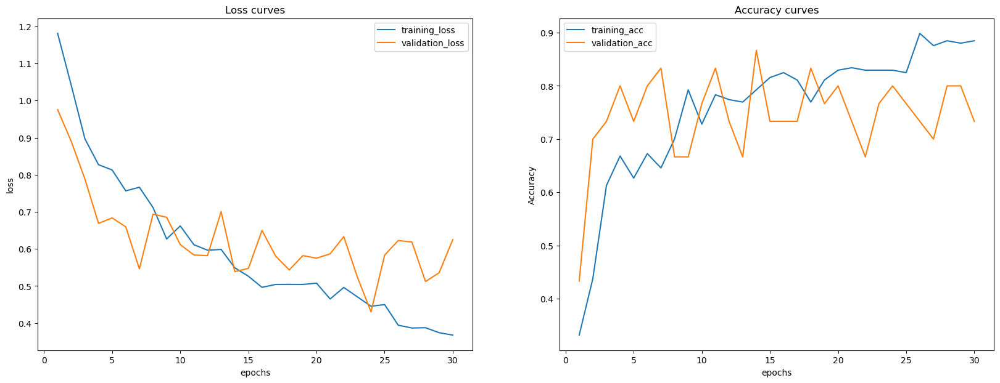

In [87]:
plot_loss_curves(history_VGG16_freeze)

In [88]:
# Save the model in the folder
VGG16_model_freeze.save(os.path.join(folder_path, 'VGG16_model_freeze.h5'))

In [89]:
from tensorflow.keras.models import load_model
test_datagen = ImageDataGenerator(rescale=1./255)


model = models.load_model('field_model/VGG16_model_freeze.h5')

# Load the test data using the test_generator
test_generator = test_datagen.flow_from_directory(
        test_field_dir,
        target_size=(180, 180),
        batch_size=5,
        class_mode='categorical',
        classes = ['good_field', 'green_field', 'spots_field'])


# Evaluate the model on the test data
test_loss, test_acc = model.evaluate(test_generator, steps=len(test_generator))
print('Test accuracy:', test_acc)

Found 21 images belonging to 3 classes.
5/5 [==============================] - 4s 574ms/step - loss: 0.6666 - acc: 0.7143
Test accuracy: 0.7142857313156128


In [90]:
VGG16_freeze = (test_loss, test_acc)

evaluation_results_field.update({"VGG16_freeze_model" : VGG16_freeze})

In [92]:
evaluation_results(evaluation_results_field)

Model Name:  basic_model 

Loss: 0.6878840327262878 	Accuracy: 0.6190476417541504

Model Name:  basic_model_callback 

Loss: 0.7645411491394043 	Accuracy: 0.6190476417541504

Model Name:  augment_model 

Loss: 0.6669044494628906 	Accuracy: 0.761904776096344

Model Name:  augment_model_callback 

Loss: 0.6274863481521606 	Accuracy: 0.761904776096344

Model Name:  VGG16_freeze_model 

Loss: 0.6666291356086731 	Accuracy: 0.7142857313156128



#### d. De-freeze 1 Layer of the ConvBase

In [93]:
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.applications import VGG16
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# see VGG16 as conv_base with best working input pixel-size of 224 and 224 to increase the level of detail
conv_base = VGG16(weights='imagenet', include_top = False, input_shape = (224,224,3))

# define the model 
VGG16_model_unfreeze = models.Sequential()
VGG16_model_unfreeze.add(conv_base)
VGG16_model_unfreeze.add(layers.Flatten())
VGG16_model_unfreeze.add(layers.Dense(64, activation='relu'))
VGG16_model_unfreeze.add(layers.Dense(3, activation='softmax'))

# best working training data augmentation parameter 
train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=15,
      width_shift_range=0.12,
      height_shift_range=0.12,
      #shear_range=0.1,
      #zoom_range=0.1,
      zoom_range=[0.9,1.1],
      brightness_range = [0.8, 1.2],
      horizontal_flip=True,
      fill_mode='nearest'
      )

test_datagen = ImageDataGenerator(rescale=1./255)


train_generator = train_datagen.flow_from_directory(
        train_field_dir,
        target_size=(224, 224),
        # to have the optimal performance 
        batch_size=30,
        class_mode='categorical',
        classes = ['good_field', 'green_field', 'spots_field'])

validation_generator = test_datagen.flow_from_directory(
        validate_field_dir,
        target_size=(224, 244),
        batch_size=30,
        class_mode='categorical',
        classes = ['good_field', 'green_field', 'spots_field'])

# de-freeze the last layer of the conbase to use the pre-estimates and adjust them specififcally to the given classification model 
conv_base.trainable = True
set_trainable = False
for layer in conv_base.layers:
    if layer.name == 'block5_conv1':
        set_trainable = True
    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False

VGG16_model_unfreeze.compile(loss='categorical_crossentropy',
# due to de-freeze of the convbase small learning with the best working Optimizer 
              optimizer=Adam(learning_rate=0.00016),
              metrics=['acc'])


# number of samples in the training and validation sets
train_samples = len(train_generator.filenames)
val_samples = len(validation_generator.filenames)

# Set the batch size
batch_size = 30

# Set up the ReduceLROnPlateau callback to avoid 
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, verbose=1, min_lr=0.00001)

# Calculation of the the steps per epoch and validation steps
steps_per_epoch = train_samples // batch_size
validation_steps = val_samples // batch_size

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the folder path where you want to save the model
model_path = 'field_model/'

checkpoint_path = os.path.join(model_path, 'checkpoint_VGG16_unfreeze_model_layer1.h5')

# checkpoint which is not meaningful due to high fluctuatuion 
checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_acc', verbose=1, save_best_only=True, mode='max')


# Train the model
history_VGG16_unfreeze = VGG16_model_unfreeze.fit(
  train_generator,
  steps_per_epoch=steps_per_epoch,   
  # to avoid over- and underfitting, best trained parameter to get the
    # swapping point 
  epochs=30,
  validation_data=validation_generator,
  validation_steps=validation_steps,
  callbacks=[checkpoint, reduce_lr]
)

Found 247 images belonging to 3 classes.
Found 41 images belonging to 3 classes.
Epoch 1/30
8/8 [==============================] - ETA: 0s - loss: 1.1758 - acc: 0.3825 
Epoch 1: val_acc improved from -inf to 0.56667, saving model to field_model\checkpoint_VGG16_unfreeze_model_layer1.h5
8/8 [==============================] - 106s 14s/step - loss: 1.1758 - acc: 0.3825 - val_loss: 0.9702 - val_acc: 0.5667 - lr: 1.6000e-04
Epoch 2/30
8/8 [==============================] - ETA: 0s - loss: 0.9948 - acc: 0.4654 
Epoch 2: val_acc did not improve from 0.56667
8/8 [==============================] - 129s 16s/step - loss: 0.9948 - acc: 0.4654 - val_loss: 0.8343 - val_acc: 0.5333 - lr: 1.6000e-04
Epoch 3/30
8/8 [==============================] - ETA: 0s - loss: 0.8110 - acc: 0.6406 
Epoch 3: val_acc did not improve from 0.56667
8/8 [==============================] - 118s 14s/step - loss: 0.8110 - acc: 0.6406 - val_loss: 0.7612 - val_acc: 0.5667 - lr: 1.6000e-04
Epoch 4/30
8/8 [=====================

In [94]:
# Save the model in the folder
VGG16_model_unfreeze.save(os.path.join(folder_path, 'VGG16_unfreeze_model_layer1.h5'))

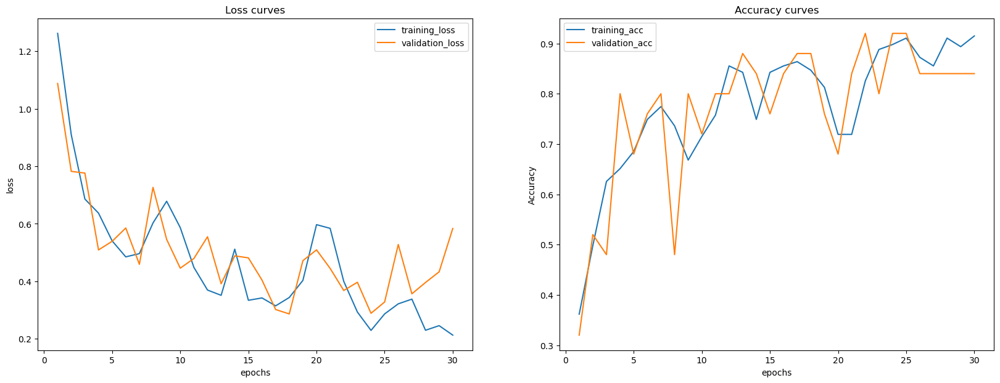

In [ ]:
# there might be a small difference between estimated model and plotted since there was a typo in the blocking. The code was
# run again to ensure that it works, but the plot was wrong, so I added the plot of my back-up copy of this, both accuracy 
# were exactly the same for this just the plot was missing
plot_loss_curves(history_VGG16_unfreeze)

In [96]:
from tensorflow.keras.models import load_model
test_datagen = ImageDataGenerator(rescale=1./255)


model = models.load_model('field_model/VGG16_unfreeze_model_layer1.h5')

# Load the test data using the test_generator
test_generator = test_datagen.flow_from_directory(
        test_field_dir,
        target_size=(224, 224),
        batch_size=20,
        class_mode='categorical',
        classes = ['good_field', 'green_field', 'spots_field'])


# Evaluate the model on the test data
test_loss, test_acc = VGG16_model_unfreeze.evaluate(test_generator, steps=len(test_generator))
print('Test accuracy:', test_acc)

Found 21 images belonging to 3 classes.
1/1 [==============================] - 4s 4s/step - loss: 0.1983 - acc: 0.9048
Test accuracy: 0.9047619104385376


In [98]:
VGG16_freeze = (test_loss, test_acc)

evaluation_results_field.update({"VGG16_freeze_model_layer1" : VGG16_freeze})

#### e. De-freeze 2 Layers of the ConvBase

In [99]:
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.applications import VGG16
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

conv_base = VGG16(weights='imagenet', include_top = False, input_shape = (224,224,3))

VGG16_model_unfreeze = models.Sequential()
VGG16_model_unfreeze.add(conv_base)
VGG16_model_unfreeze.add(layers.Flatten())
VGG16_model_unfreeze.add(layers.Dense(64, activation='relu'))
VGG16_model_unfreeze.add(layers.Dense(3, activation='softmax'))

train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=15,
      width_shift_range=0.12,
      height_shift_range=0.12,
      #shear_range=0.1,
      #zoom_range=0.1,
      zoom_range=[0.9,1.1],
      brightness_range = [0.8, 1.2],
      horizontal_flip=True,
      fill_mode='nearest'
      )

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_field_dir,
        target_size=(224, 224),
        batch_size=30,
        class_mode='categorical',
        classes = ['good_field', 'green_field', 'spots_field'])

validation_generator = test_datagen.flow_from_directory(
        validate_field_dir,
        target_size=(224, 224),
        batch_size=30,
        class_mode='categorical',
        classes = ['good_field', 'green_field', 'spots_field'])


conv_base.trainable = True
set_trainable = False
for layer in conv_base.layers:
    if layer.name == 'block4_conv1':
        set_trainable = True
    if layer.name == 'block5_conv1':
        set_trainable = True
    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False

VGG16_model_unfreeze.compile(loss='categorical_crossentropy',
              optimizer=Adam(learning_rate=0.00016), #0.00001
              metrics=['acc'])


# number of samples in the training and validation sets
train_samples = len(train_generator.filenames)
val_samples = len(validation_generator.filenames)

# Set the batch size
batch_size = 30

# Set up the ReduceLROnPlateau callback
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, verbose=1, min_lr=0.00001)

# Calculation of the the steps per epoch and validation steps
steps_per_epoch = train_samples // batch_size
validation_steps = val_samples // batch_size

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the folder path where you want to save the model
model_path = 'field_model/'

checkpoint_path = os.path.join(model_path, 'checkpoint_VGG16_unfreeze_model.h5')

import time

# add timestamp to checkpoint filename
checkpoint_path = f"models/weights-{time.time()}.h5"

checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_acc', verbose=1, save_best_only=True, mode='max')

early_stop = EarlyStopping(monitor='val_acc', patience=10)

# Train the model
history_VGG16_unfreeze = VGG16_model_unfreeze.fit(
  train_generator,
  steps_per_epoch=steps_per_epoch,      
  epochs=30,
  validation_data=validation_generator,
  validation_steps=validation_steps,
  callbacks=[checkpoint, reduce_lr, early_stop]
)

Found 247 images belonging to 3 classes.
Found 41 images belonging to 3 classes.
Epoch 1/30
8/8 [==============================] - ETA: 0s - loss: 1.3117 - acc: 0.2765
Epoch 1: val_acc improved from -inf to 0.33333, saving model to models\weights-1683372844.5777013.h5
8/8 [==============================] - 65s 8s/step - loss: 1.3117 - acc: 0.2765 - val_loss: 1.0990 - val_acc: 0.3333 - lr: 1.6000e-04
Epoch 2/30
8/8 [==============================] - ETA: 0s - loss: 1.0682 - acc: 0.3871 
Epoch 2: val_acc improved from 0.33333 to 0.40000, saving model to models\weights-1683372844.5777013.h5
8/8 [==============================] - 99s 13s/step - loss: 1.0682 - acc: 0.3871 - val_loss: 1.1104 - val_acc: 0.4000 - lr: 1.6000e-04
Epoch 3/30
8/8 [==============================] - ETA: 0s - loss: 1.1464 - acc: 0.4332 
Epoch 3: val_acc improved from 0.40000 to 0.43333, saving model to models\weights-1683372844.5777013.h5
8/8 [==============================] - 143s 18s/step - loss: 1.1464 - acc: 0.4

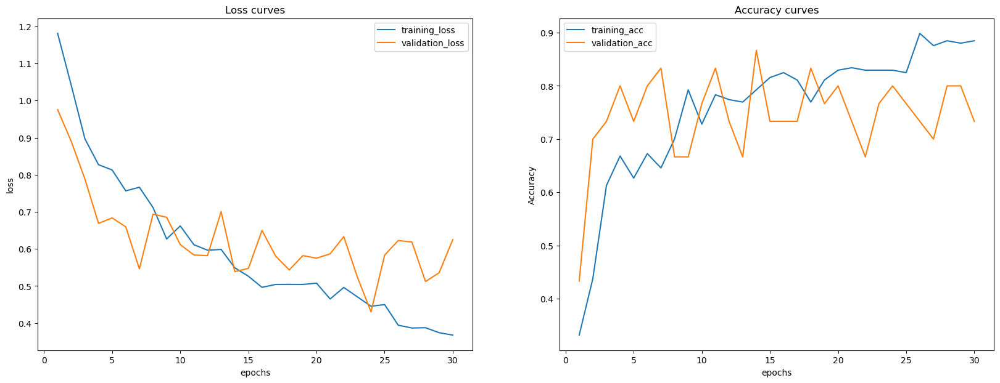

In [100]:
plot_loss_curves(history_VGG16_unfreeze)

In [101]:
# Save the model in the folder
VGG16_model_unfreeze.save(os.path.join(folder_path, 'VGG16_unfreeze_model_layer2.h5'))

In [102]:
from tensorflow.keras.models import load_model
test_datagen = ImageDataGenerator(rescale=1./255)


model = models.load_model('field_model/VGG16_unfreeze_model_layer2.h5')

# Load the test data using the test_generator
test_generator = test_datagen.flow_from_directory(
        test_field_dir,
        target_size=(224, 224),
        batch_size=30,
        class_mode='categorical',
        classes = ['good_field', 'green_field', 'spots_field'])


# Evaluate the model on the test data
test_loss, test_acc = model.evaluate(test_generator, steps=len(test_generator))
print('Test accuracy:', test_acc)

Found 21 images belonging to 3 classes.
1/1 [==============================] - 4s 4s/step - loss: 0.4507 - acc: 0.7619
Test accuracy: 0.761904776096344


In [103]:
VGG16_model_unfreeze_callback = (test_loss, test_acc)

evaluation_results_field.update({"VGG16_model_unfreeze_2layers" :VGG16_model_unfreeze_callback})

In [104]:
evaluation_results(evaluation_results_field)

Model Name:  basic_model 

Loss: 0.6878840327262878 	Accuracy: 0.6190476417541504

Model Name:  basic_model_callback 

Loss: 0.7645411491394043 	Accuracy: 0.6190476417541504

Model Name:  augment_model 

Loss: 0.6669044494628906 	Accuracy: 0.761904776096344

Model Name:  augment_model_callback 

Loss: 0.6274863481521606 	Accuracy: 0.761904776096344

Model Name:  VGG16_freeze_model 

Loss: 0.6666291356086731 	Accuracy: 0.7142857313156128

Model Name:  VGG16_freeze_model_layer1 

Loss: 0.1983325183391571 	Accuracy: 0.9047619104385376

Model Name:  VGG16_model_unfreeze_2layers 

Loss: 0.450732946395874 	Accuracy: 0.761904776096344



### 4. Model building warehouse

In [130]:
# Define the folder path where you want to save the model
folder_path = 'warehouse_model/'

# Create the folder if it does not exist
if not os.path.exists(folder_path):
    os.makedirs(folder_path)

evaluation_results_warehouse = {}

##### a. CNN-basic

In [120]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator


train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)


#This is how we can make generators. They sample several images (i.e., the batch size)
#from the specified directories. 
#The target size equals the (height, width), to which all images found will be resized.

train_generator = train_datagen.flow_from_directory(
        train_warehouse_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary',
        classes = ['good_warehouse', 'spots_warehouse'])

validation_generator = test_datagen.flow_from_directory(
        validate_warehouse_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary',
        classes = ['good_warehouse', 'spots_warehouse'])

Found 331 images belonging to 2 classes.
Found 42 images belonging to 2 classes.


In [121]:
from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras import optimizers


basic_model_warehouse = models.Sequential()
basic_model_warehouse.add(layers.Conv2D(32, (3, 3), activation='relu',
                        input_shape=(150, 150, 3)))
basic_model_warehouse.add(layers.MaxPooling2D((2, 2)))
basic_model_warehouse.add(layers.Conv2D(64, (3, 3), activation='relu'))
basic_model_warehouse.add(layers.MaxPooling2D((2, 2)))
basic_model_warehouse.add(layers.Conv2D(128, (3, 3), activation='relu'))
basic_model_warehouse.add(layers.MaxPooling2D((2, 2)))
basic_model_warehouse.add(layers.Conv2D(128, (3, 3), activation='relu'))
basic_model_warehouse.add(layers.MaxPooling2D((2, 2)))
basic_model_warehouse.add(layers.Flatten())
basic_model_warehouse.add(layers.Dense(512, activation='relu'))
basic_model_warehouse.add(layers.Dense(1, activation='sigmoid'))


basic_model_warehouse.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(learning_rate=1e-4),
              metrics=['acc'])

In [122]:
from keras.models import Sequential
from keras.layers import Dense
from keras.callbacks import Callback, ModelCheckpoint
from tensorflow.keras.callbacks import EarlyStopping

class MyCallback(Callback):
    def on_epoch_end(self, epoch, logs=None):
        # do something at the end of each epoch
        print("End of epoch:", epoch)
        print("Accuracy:", logs["accuracy"])
        
    def on_train_end(self, logs=None):
        # do something at the end of the training process
        print("Training ended")

early_stop = EarlyStopping(monitor='val_acc', patience=5)

In [123]:
# number of samples in the training and validation sets
train_samples = len(train_generator.filenames)
val_samples = len(validation_generator.filenames)

# Set the batch size
batch_size = 20

# Calculation of the the steps per epoch and validation steps
steps_per_epoch = train_samples // batch_size
validation_steps = val_samples // batch_size


# Define the folder path where you want to save the model
model_path = 'warehouse_model/'

early_stop = EarlyStopping(monitor='val_acc', patience=10)

checkpoint_path = os.path.join(model_path, 'checkpoint_basic_model.h5')

# Train the model
checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_acc', verbose=1, save_best_only=True, mode='max')

# Train the model with the callback
history_basic_model_warehouse = basic_model_warehouse.fit(
    train_generator,
    steps_per_epoch=steps_per_epoch,
    epochs=20,
    validation_data=validation_generator,
    validation_steps=validation_steps,
    callbacks=[checkpoint, early_stop]
)

Epoch 1/20
16/16 [==============================] - ETA: 0s - loss: 0.4808 - acc: 0.8392
Epoch 1: val_acc improved from -inf to 0.60000, saving model to warehouse_model\checkpoint_basic_model.h5
16/16 [==============================] - 42s 3s/step - loss: 0.4808 - acc: 0.8392 - val_loss: 0.8361 - val_acc: 0.6000
Epoch 2/20
16/16 [==============================] - ETA: 0s - loss: 0.4532 - acc: 0.8264
Epoch 2: val_acc did not improve from 0.60000
16/16 [==============================] - 35s 2s/step - loss: 0.4532 - acc: 0.8264 - val_loss: 0.6501 - val_acc: 0.5750
Epoch 3/20
16/16 [==============================] - ETA: 0s - loss: 0.4340 - acc: 0.8232
Epoch 3: val_acc did not improve from 0.60000
16/16 [==============================] - 35s 2s/step - loss: 0.4340 - acc: 0.8232 - val_loss: 0.7458 - val_acc: 0.6000
Epoch 4/20
16/16 [==============================] - ETA: 0s - loss: 0.4014 - acc: 0.8392
Epoch 4: val_acc did not improve from 0.60000
16/16 [==============================] - 35

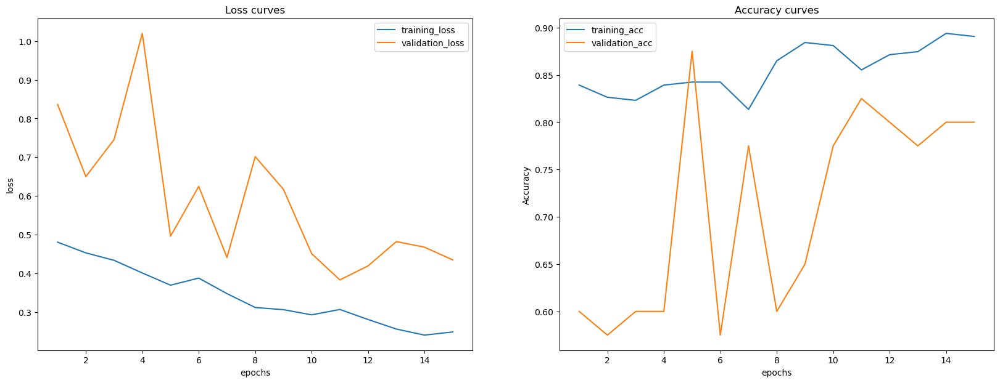

In [124]:
plot_loss_curves(history_basic_model_warehouse)

In [127]:
# Save the model in the folder
basic_model_warehouse.save(os.path.join(model_path, 'basic_warehouse_model.h5'))

In [128]:
from tensorflow.keras.models import load_model

model = models.load_model('warehouse_model/basic_warehouse_model.h5')

# Load the test data using the test_generator
test_generator = test_datagen.flow_from_directory(
    test_warehouse_dir,
    target_size=(150, 150),
    batch_size=20,
    class_mode='binary',
    classes = ['good_warehouse', 'spots_warehouse'])

# Evaluate the model on the test data
test_loss, test_acc = model.evaluate(test_generator, steps=len(test_generator))
print('Test accuracy:', test_acc)

Found 41 images belonging to 2 classes.
3/3 [==============================] - 4s 1s/step - loss: 0.1930 - acc: 0.8780
Test accuracy: 0.8780487775802612


In [131]:
basic_warehouse = (test_loss, test_acc)

evaluation_results_warehouse.update({"basic_model" :basic_warehouse})

In [132]:
from tensorflow.keras.models import load_model

model = models.load_model('warehouse_model/checkpoint_basic_model.h5')

# Load the test data using the test_generator
test_generator = test_datagen.flow_from_directory(
    test_warehouse_dir,
    target_size=(150, 150),
    batch_size=20,
    class_mode='binary',
    classes = ['good_warehouse', 'spots_warehouse'])

# Evaluate the model on the test data
test_loss, test_acc = model.evaluate(test_generator, steps=len(test_generator))
print('Test accuracy:', test_acc)

Found 41 images belonging to 2 classes.
3/3 [==============================] - 4s 981ms/step - loss: 0.4272 - acc: 0.9512
Test accuracy: 0.9512194991111755


In [133]:
basic_model_callback = (test_loss, test_acc)

evaluation_results_warehouse.update({"basic_model_callback" :basic_model_callback})

In [134]:
evaluation_results(evaluation_results_warehouse)

Model Name:  basic_model 

Loss: 0.19298672676086426 	Accuracy: 0.8780487775802612

Model Name:  basic_model_callback 

Loss: 0.4271825850009918 	Accuracy: 0.9512194991111755



##### b. Data Augmentation

./warehouse_split\train\good_warehouse\good_warehouse.10.jpg


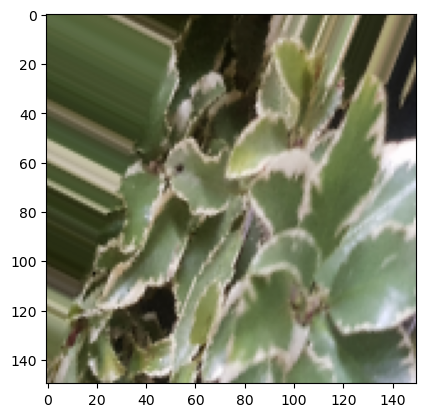

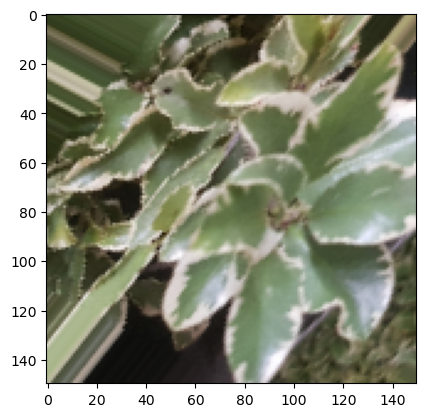

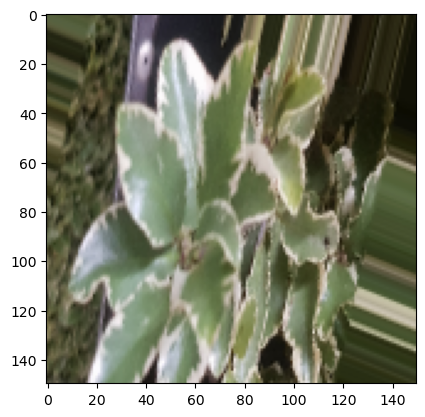

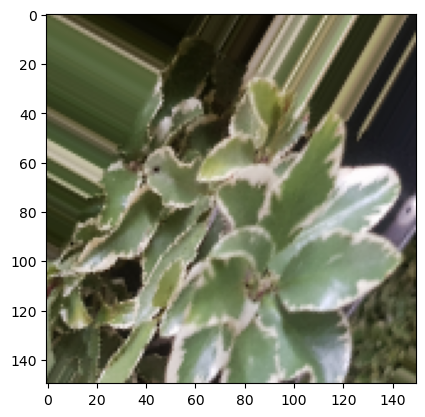

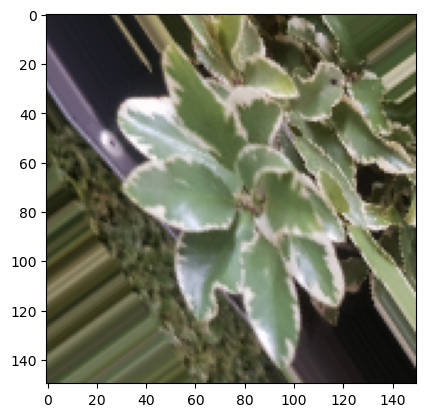

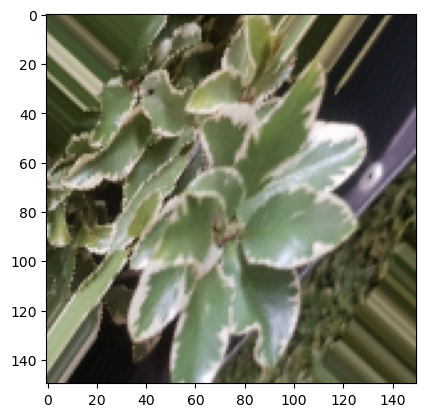

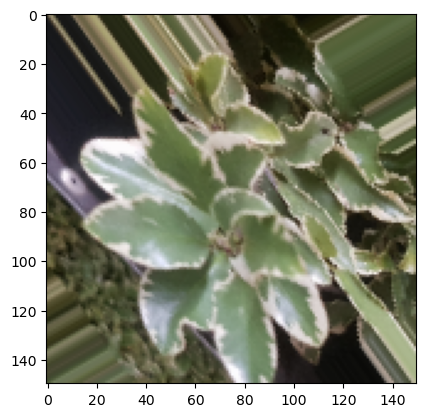

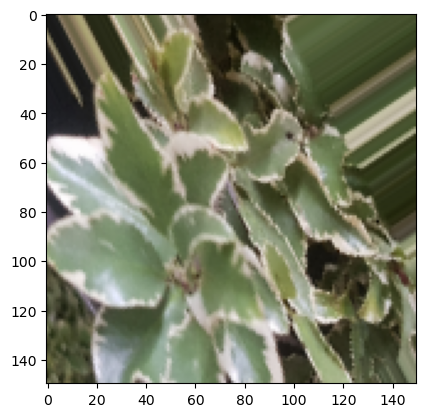

In [135]:
datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=15,
      width_shift_range=0.12,
      height_shift_range=0.12,
      zoom_range=[0.9,1.1],
      brightness_range=[0.8, 1.2],
      horizontal_flip=True,
      fill_mode='nearest'
      )

from tensorflow.keras.preprocessing import image

fnames = [os.path.join(subdirectories_good_warehouse[0], fname) for
     fname in os.listdir(subdirectories_good_warehouse[0])]

img_path = fnames[0]
print(img_path)

img = image.load_img(img_path, target_size=(150, 150))

x = image.img_to_array(img)
x = x.reshape((1,) + x.shape)

i = 0
for batch in datagen.flow(x, batch_size=1):
    plt.figure(i)
    imgplot = plt.imshow(image.array_to_img(batch[0]))
    i += 1
    if i % 8 == 0:
        break

plt.show()

In [136]:
augment_warehouse = models.Sequential()
augment_warehouse.add(layers.Conv2D(32, (3, 3), activation='relu',
                        input_shape=(150, 150, 3)))
augment_warehouse.add(layers.MaxPooling2D((2, 2)))
augment_warehouse.add(layers.Conv2D(64, (3, 3), activation='relu'))
augment_warehouse.add(layers.MaxPooling2D((2, 2)))
augment_warehouse.add(layers.Conv2D(128, (3, 3), activation='relu'))
augment_warehouse.add(layers.MaxPooling2D((2, 2)))
augment_warehouse.add(layers.Conv2D(128, (3, 3), activation='relu'))
augment_warehouse.add(layers.MaxPooling2D((2, 2)))
augment_warehouse.add(layers.Flatten())
augment_warehouse.add(layers.Dropout(0.5))
augment_warehouse.add(layers.Dense(512, activation='relu'))
augment_warehouse.add(layers.Dense(1, activation='sigmoid'))

augment_warehouse.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(learning_rate=1e-4),
              metrics=['acc'])


In [137]:
train_datagen = ImageDataGenerator(
      rotation_range=20,
      width_shift_range=0.1,
      height_shift_range=0.1,
      shear_range=0.1,
      zoom_range=0.1,
      horizontal_flip=True,
      fill_mode='nearest')

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.applications import VGG16
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator

conv_base = VGG16(weights='imagenet', include_top=False, input_shape=(180,180,3))

VGG16_model_freeze = models.Sequential()
VGG16_model_freeze.add(conv_base)
VGG16_model_freeze.add(layers.Flatten())
VGG16_model_freeze.add(layers.Dense(64, activation='relu'))
VGG16_model_freeze.add(layers.Dense(1, activation='sigmoid'))

train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=15,
      width_shift_range=0.12,
      height_shift_range=0.12,
      zoom_range=[0.9,1.1],
      brightness_range=[0.8, 1.2],
      horizontal_flip=True,
      fill_mode='nearest'
      )

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_field_dir,
        target_size=(180, 180),
        batch_size=30,
        class_mode='binary',
        classes=['good_field', 'spots_field'])

validation_generator = test_datagen.flow_from_directory(
        validate_field_dir,
        target_size=(180, 180),
        batch_size=30,
        class_mode='binary',
        classes=['good_field', 'spots_field'])

conv_base.trainable = False

VGG16_model_freeze.compile(loss='binary_crossentropy',
              optimizer=Adam(learning_rate=0.00016),
              metrics=['acc'])

# number of samples in the training and validation sets
train_samples = len(train_generator.filenames)
val_samples = len(validation_generator.filenames)

# Set the batch size
batch_size = 30

# Calculation of the the steps per epoch and validation steps
steps_per_epoch = train_samples // batch_size
validation_steps = val_samples // batch_size

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the folder path where you want to save the model
model_path = 'field_model/'

checkpoint_path = os.path.join(model_path, 'checkpoint_VGG16_unfreeze_model.h5')

# Train the model
checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_acc', verbose=1, save_best_only=True, mode='max')

# Train the model
history_VGG16_freeze = VGG16_model_freeze.fit(
  train_generator,
  steps_per_epoch=steps_per_epoch,      
  epochs=30,
  validation_data=validation_generator,
  validation_steps=validation_steps,
  callbacks=[checkpoint]
)
,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary',
        classes = ['good_warehouse', 'spots_warehouse'])

validation_generator = test_datagen.flow_from_directory(
        validate_warehouse_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary',
        classes = ['good_warehouse', 'spots_warehouse'])

Found 331 images belonging to 2 classes.
Found 42 images belonging to 2 classes.


In [138]:
# number of samples in the training and validation sets
train_samples = len(train_generator.filenames)
val_samples = len(validation_generator.filenames)

# Set the batch size
batch_size = 20

# Calculation of the the steps per epoch and validation steps
steps_per_epoch = train_samples // batch_size
validation_steps = val_samples // batch_size

# Define the folder path where you want to save the model
model_path = 'warehouse_model/'

checkpoint_path = os.path.join(model_path, 'checkpoint_augment_warehouse.h5')

early_stop = EarlyStopping(monitor='val_acc', patience=5)

# Train the model
checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_acc', verbose=1, save_best_only=True, mode='max')

# Train the model with the callback
history_augment_model_warehpuse = augment_warehouse.fit(
    train_generator,
    steps_per_epoch=steps_per_epoch,
    epochs=20,
    validation_data=validation_generator,
    validation_steps=validation_steps,
    callbacks=[checkpoint, early_stop]
)

Epoch 1/20
16/16 [==============================] - ETA: 0s - loss: 11.8451 - acc: 0.6945
Epoch 1: val_acc improved from -inf to 0.42500, saving model to warehouse_model\checkpoint_augment_warehouse.h5
16/16 [==============================] - 89s 6s/step - loss: 11.8451 - acc: 0.6945 - val_loss: 0.6920 - val_acc: 0.4250
Epoch 2/20
16/16 [==============================] - ETA: 0s - loss: 2.5502 - acc: 0.7267
Epoch 2: val_acc improved from 0.42500 to 0.57500, saving model to warehouse_model\checkpoint_augment_warehouse.h5
16/16 [==============================] - 90s 6s/step - loss: 2.5502 - acc: 0.7267 - val_loss: 0.6907 - val_acc: 0.5750
Epoch 3/20
16/16 [==============================] - ETA: 0s - loss: 1.2285 - acc: 0.7428
Epoch 3: val_acc improved from 0.57500 to 0.60000, saving model to warehouse_model\checkpoint_augment_warehouse.h5
16/16 [==============================] - 83s 5s/step - loss: 1.2285 - acc: 0.7428 - val_loss: 0.6880 - val_acc: 0.6000
Epoch 4/20
16/16 [==============

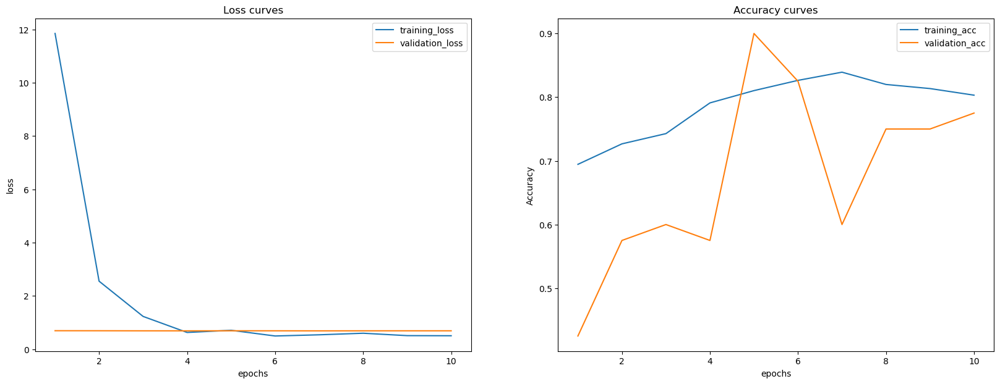

In [139]:
plot_loss_curves(history_augment_model_warehpuse)

In [140]:
# Save the model in the folder
augment_warehouse.save(os.path.join(folder_path, 'augment_warehouse.h5'))

In [141]:
from tensorflow.keras.models import load_model

model = models.load_model('warehouse_model/augment_warehouse.h5')

# Load the test data using the test_generator
test_generator = test_datagen.flow_from_directory(
    test_warehouse_dir,
    target_size=(150, 150),
    batch_size=20,
    class_mode='binary',
    classes = ['good_warehouse', 'spots_warehouse'])

# Evaluate the model on the test data
test_loss, test_acc = model.evaluate(test_generator, steps=len(test_generator))
print('Test accuracy:', test_acc)

Found 41 images belonging to 2 classes.
3/3 [==============================] - 4s 982ms/step - loss: 0.6872 - acc: 0.9024
Test accuracy: 0.9024389982223511


In [142]:
augment_model_warehouse = (test_loss, test_acc)

evaluation_results_warehouse.update({"augment_model" : augment_model_warehouse })

In [143]:
from tensorflow.keras.models import load_model

model = models.load_model('warehouse_model/checkpoint_augment_warehouse.h5')

# Load the test data using the test_generator
test_generator = test_datagen.flow_from_directory(
    test_warehouse_dir,
    target_size=(150, 150),
    batch_size=20,
    class_mode='binary',
    classes = ['good_warehouse', 'spots_warehouse'])

# Evaluate the model on the test data
test_loss, test_acc = model.evaluate(test_generator, steps=len(test_generator))
print('Test accuracy:', test_acc)

Found 41 images belonging to 2 classes.
3/3 [==============================] - 4s 982ms/step - loss: 0.6908 - acc: 0.8049
Test accuracy: 0.8048780560493469


In [144]:
augment_model_callback = (test_loss, test_acc)

evaluation_results_warehouse.update({"augment_model_callback" :augment_model_callback})

In [145]:
evaluation_results(evaluation_results_warehouse)

Model Name:  basic_model 

Loss: 0.19298672676086426 	Accuracy: 0.8780487775802612

Model Name:  basic_model_callback 

Loss: 0.4271825850009918 	Accuracy: 0.9512194991111755

Model Name:  augment_model 

Loss: 0.6871925592422485 	Accuracy: 0.9024389982223511

Model Name:  augment_model_callback 

Loss: 0.690800130367279 	Accuracy: 0.8048780560493469



##### c. VGG16 Learning rate

In [156]:
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.applications import VGG16
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# best working pixel size for the warehouse 
conv_base = VGG16(weights='imagenet', include_top=False, input_shape=(180,180,3))


# state the model
VGG16_model_freeze = models.Sequential()
VGG16_model_freeze.add(conv_base)
VGG16_model_freeze.add(layers.Flatten())
VGG16_model_freeze.add(layers.Dense(64, activation='relu'))
VGG16_model_freeze.add(layers.Dense(1, activation='sigmoid'))

# most meaningful data augmentation parameter 
train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=15,
      width_shift_range=0.12,
      height_shift_range=0.12,
      zoom_range=[0.9,1.1],
      brightness_range=[0.8, 1.2],
      horizontal_flip=True,
      fill_mode='nearest'
      )

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_warehouse_dir,
        target_size=(180, 180),
        batch_size=30,
        class_mode='binary',
        classes=['good_warehouse', 'spots_warehouse'])

validation_generator = test_datagen.flow_from_directory(
        validate_warehouse_dir,
        target_size=(180, 180),
        batch_size=30,
        class_mode='binary',
        classes=['good_warehouse', 'spots_warehouse'])

conv_base.trainable = False

VGG16_model_freeze.compile(loss='binary_crossentropy',
        # small learning rate to adjust the model to the convbase 
              optimizer=Adam(learning_rate=0.00016),
              metrics=['acc'])

# number of samples in the training and validation sets
train_samples = len(train_generator.filenames)
val_samples = len(validation_generator.filenames)

# Set the batch size
batch_size = 30

# Calculation of the the steps per epoch and validation steps
steps_per_epoch = train_samples // batch_size
validation_steps = val_samples // batch_size

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the folder path where you want to save the model
model_path = 'warehouse_model/'

checkpoint_path = os.path.join(model_path, 'checkpoint_VGG16_unfreeze_model.h5')

# Train the model
checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_acc', verbose=1, save_best_only=True, mode='max')

# Train the model
history_VGG16_freeze = VGG16_model_freeze.fit(
  train_generator,
  steps_per_epoch=steps_per_epoch,      
  epochs=30,
  validation_data=validation_generator,
  validation_steps=validation_steps,
  callbacks=[checkpoint, early_stop]
)

Found 331 images belonging to 2 classes.
Found 42 images belonging to 2 classes.
Epoch 1/30
11/11 [==============================] - ETA: 0s - loss: 0.4537 - acc: 0.8272
Epoch 1: val_acc improved from -inf to 0.73333, saving model to warehouse_model\checkpoint_VGG16_unfreeze_model.h5
11/11 [==============================] - 72s 7s/step - loss: 0.4537 - acc: 0.8272 - val_loss: 0.4877 - val_acc: 0.7333
Epoch 2/30
11/11 [==============================] - ETA: 0s - loss: 0.3245 - acc: 0.8339
Epoch 2: val_acc did not improve from 0.73333
11/11 [==============================] - 71s 6s/step - loss: 0.3245 - acc: 0.8339 - val_loss: 0.5527 - val_acc: 0.6333
Epoch 3/30
11/11 [==============================] - ETA: 0s - loss: 0.2272 - acc: 0.8970
Epoch 3: val_acc improved from 0.73333 to 0.90000, saving model to warehouse_model\checkpoint_VGG16_unfreeze_model.h5
11/11 [==============================] - 69s 6s/step - loss: 0.2272 - acc: 0.8970 - val_loss: 0.3041 - val_acc: 0.9000
Epoch 4/30
11/11

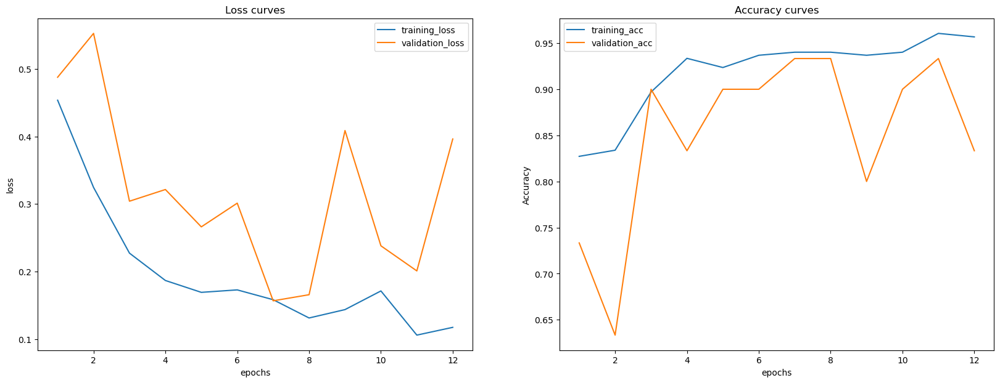

In [158]:
plot_loss_curves(history_VGG16_freeze)

In [160]:
# Save the model in the folder
VGG16_model_freeze.save(os.path.join(folder_path, 'VGG16_warehouse.h5'))

In [162]:
from tensorflow.keras.models import load_model

model = models.load_model('warehouse_model/VGG16_warehouse.h5')

# Load the test data using the test_generator
test_generator = test_datagen.flow_from_directory(
    test_warehouse_dir,
    target_size=(180, 180),
    batch_size=20,
    class_mode='binary',
    classes = ['good_warehouse', 'spots_warehouse'])

# Evaluate the model on the test data
test_loss, test_acc = model.evaluate(test_generator, steps=len(test_generator))
print('Test accuracy:', test_acc)

Found 41 images belonging to 2 classes.
3/3 [==============================] - 6s 1s/step - loss: 0.1496 - acc: 0.9024
Test accuracy: 0.9024389982223511


In [163]:
VGG16_field = (test_loss, test_acc)

evaluation_results_warehouse.update({"VGG16_model" : VGG16_field })

In [165]:
from tensorflow.keras.models import load_model

model = models.load_model('warehouse_model/checkpoint_VGG16_unfreeze_model.h5')

# Load the test data using the test_generator
test_generator = test_datagen.flow_from_directory(
    test_warehouse_dir,
    target_size=(180, 180),
    batch_size=20,
    class_mode='binary',
    classes = ['good_warehouse', 'spots_warehouse'])

# Evaluate the model on the test data
test_loss, test_acc = model.evaluate(test_generator, steps=len(test_generator))
print('Test accuracy:', test_acc)

Found 41 images belonging to 2 classes.
3/3 [==============================] - 6s 1s/step - loss: 0.1591 - acc: 0.8780
Test accuracy: 0.8780487775802612


In [166]:
VGG16_model_callback = (test_loss, test_acc)

evaluation_results_warehouse.update({"VGG16_model_callback" :VGG16_model_callback})

In [167]:
evaluation_results(evaluation_results_warehouse)

Model Name:  basic_model 

Loss: 0.19298672676086426 	Accuracy: 0.8780487775802612

Model Name:  basic_model_callback 

Loss: 0.4271825850009918 	Accuracy: 0.9512194991111755

Model Name:  augment_model 

Loss: 0.6871925592422485 	Accuracy: 0.9024389982223511

Model Name:  augment_model_callback 

Loss: 0.690800130367279 	Accuracy: 0.8048780560493469

Model Name:  VGG16_model 

Loss: 0.14959977567195892 	Accuracy: 0.9024389982223511



##### d. De-freeze 1 Layer

In [170]:
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.applications import VGG16
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator

conv_base = VGG16(weights='imagenet', include_top = False, input_shape = (180,180,3))

model = models.Sequential()
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

model.build(input_shape=(None,150,150,3))

train_datagen = ImageDataGenerator(
      rescale=1./255,
      #rotation_range=20,
      #width_shift_range=0.1,
      #height_shift_range=0.1,
      #shear_range=0.1,
      #zoom_range=0.1,
      zoom_range=[0.9,1.1],
      brightness_range = [0.8, 1.2],
      #horizontal_flip=True,
      fill_mode='nearest'
      )

test_datagen = ImageDataGenerator(rescale=1./255)

# data augementation 
train_generator = train_datagen.flow_from_directory(
        train_warehouse_dir,
        target_size=(180, 180),
        batch_size=25,
        class_mode='binary',
        classes= ['good_warehouse', 'spots_warehouse'])

# data augmentation 
validation_generator = test_datagen.flow_from_directory(
        validate_warehouse_dir,
        target_size=(180, 180),
        batch_size=25,
        class_mode='binary',
        classes= ['good_warehouse', 'spots_warehouse'])


conv_base.trainable = True
set_trainable = False
for layer in conv_base.layers:
    if layer.name == 'block5_conv1':
        set_trainable = True
    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False

model.compile(loss='binary_crossentropy',
              optimizer=Adam(learning_rate=0.00001),
              metrics=['acc'])


# number of samples in the training and validation sets
train_samples = len(train_generator.filenames)
val_samples = len(validation_generator.filenames)

# Set the batch size
batch_size = 25

# Calculation of the the steps per epoch and validation steps
steps_per_epoch = train_samples // batch_size
validation_steps = val_samples // batch_size

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the folder path where you want to save the model
model_path = 'warehouse_model/'

checkpoint_path = os.path.join(model_path, 'checkpoint_VGG16_unfreeze_warehouse.h5')

# Train the model
checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_acc', verbose=1, save_best_only=True, mode='max')

early_stop = EarlyStopping(monitor='val_acc', patience=15) #avoid overfitting and too long simulation time 

# Train the model
history_VGG16_unfreeze_warehouse = model.fit(
  train_generator,
  steps_per_epoch=steps_per_epoch,  
# swapping point early, consequently less epochs meaningful
  epochs=20,
  validation_data=validation_generator,
  validation_steps=validation_steps,
  callbacks=[checkpoint, early_stop]
)

Found 331 images belonging to 2 classes.
Found 42 images belonging to 2 classes.
Epoch 1/20
13/13 [==============================] - ETA: 0s - loss: 0.4305 - acc: 0.8246
Epoch 1: val_acc improved from -inf to 0.68000, saving model to warehouse_model\checkpoint_VGG16_unfreeze_warehouse.h5
13/13 [==============================] - 60s 5s/step - loss: 0.4305 - acc: 0.8246 - val_loss: 0.6081 - val_acc: 0.6800
Epoch 2/20
13/13 [==============================] - ETA: 0s - loss: 0.3227 - acc: 0.8301
Epoch 2: val_acc did not improve from 0.68000
13/13 [==============================] - 58s 4s/step - loss: 0.3227 - acc: 0.8301 - val_loss: 0.5578 - val_acc: 0.6000
Epoch 3/20
13/13 [==============================] - ETA: 0s - loss: 0.2592 - acc: 0.8529 
Epoch 3: val_acc improved from 0.68000 to 0.80000, saving model to warehouse_model\checkpoint_VGG16_unfreeze_warehouse.h5
13/13 [==============================] - 172s 13s/step - loss: 0.2592 - acc: 0.8529 - val_loss: 0.2949 - val_acc: 0.8000
Epoch

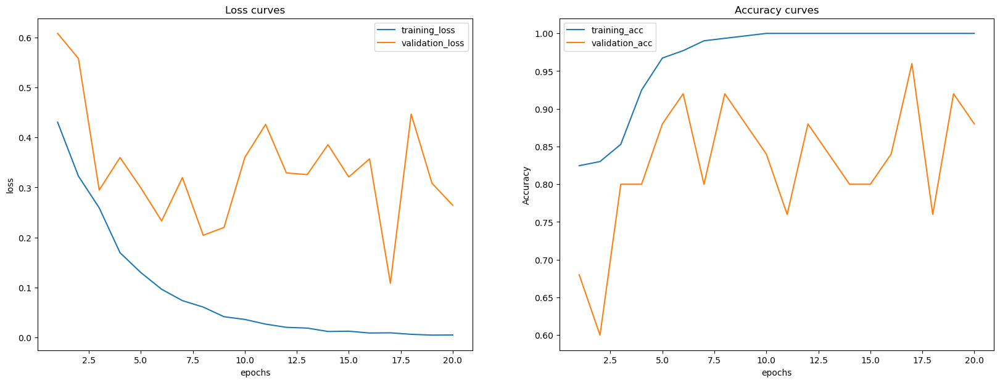

In [172]:
plot_loss_curves(history_VGG16_unfreeze_warehouse)

In [173]:
# Save the model in the folder
model.save(os.path.join(folder_path, 'VGG16_unfreeze_warehouse.h5'))

In [176]:
from tensorflow.keras.models import load_model

model = models.load_model('warehouse_model/VGG16_unfreeze_warehouse.h5')

# Load the test data using the test_generator
test_generator = test_datagen.flow_from_directory(
    test_warehouse_dir,
    target_size=(180, 180),
    batch_size=20,
    class_mode='binary',
    classes = ['good_warehouse', 'spots_warehouse'])

# Evaluate the model on the test data
test_loss, test_acc = model.evaluate(test_generator, steps=len(test_generator))
print('Test accuracy:', test_acc)

Found 41 images belonging to 2 classes.
3/3 [==============================] - 6s 1s/step - loss: 0.0767 - acc: 0.9756
Test accuracy: 0.9756097793579102


In [177]:
VGG16_unfreeze_warehouse = (test_loss, test_acc)

evaluation_results_warehouse.update({"VGG16_model_freeze" : VGG16_unfreeze_warehouse })

In [179]:
from tensorflow.keras.models import load_model

model = models.load_model('warehouse_model/checkpoint_VGG16_unfreeze_warehouse.h5')

# Load the test data using the test_generator
test_generator = test_datagen.flow_from_directory(
    test_warehouse_dir,
    target_size=(180, 180),
    batch_size=20,
    class_mode='binary',
    classes = ['good_warehouse', 'spots_warehouse'])

# Evaluate the model on the test data
test_loss, test_acc = model.evaluate(test_generator, steps=len(test_generator))
print('Test accuracy:', test_acc)

Found 41 images belonging to 2 classes.
3/3 [==============================] - 6s 1s/step - loss: 0.0637 - acc: 0.9512
Test accuracy: 0.9512194991111755


In [180]:
VGG16_model_unfreeze_callback = (test_loss, test_acc)

evaluation_results_warehouse.update({"VGG16_model_unfreeze_callback" :VGG16_model_unfreeze_callback})

### 5. Model evaluation

#### a. Field Data

In [ ]:
evaluation_results(evaluation_results_field)

Model Name:  basic_model 

Loss: 0.6878840327262878 	Accuracy: 0.6190476417541504

Model Name:  basic_model_callback 

Loss: 0.7645411491394043 	Accuracy: 0.6190476417541504

Model Name:  augment_model 

Loss: 0.6669044494628906 	Accuracy: 0.761904776096344

Model Name:  augment_model_callback 

Loss: 0.6274863481521606 	Accuracy: 0.761904776096344

Model Name:  VGG16_freeze_model 

Loss: 0.6666291356086731 	Accuracy: 0.7142857313156128

Model Name:  VGG16_freeze_model_layer1 

Loss: 0.1983325183391571 	Accuracy: 0.9047619104385376

Model Name:  VGG16_model_unfreeze_2layers 

Loss: 0.450732946395874 	Accuracy: 0.761904776096344



#### b. Warehouse Data

In [181]:
evaluation_results(evaluation_results_warehouse)

Model Name:  basic_model 

Loss: 0.19298672676086426 	Accuracy: 0.8780487775802612

Model Name:  basic_model_callback 

Loss: 0.4271825850009918 	Accuracy: 0.9512194991111755

Model Name:  augment_model 

Loss: 0.6871925592422485 	Accuracy: 0.9024389982223511

Model Name:  augment_model_callback 

Loss: 0.690800130367279 	Accuracy: 0.8048780560493469

Model Name:  VGG16_model 

Loss: 0.14959977567195892 	Accuracy: 0.9024389982223511

Model Name:  VGG16_model_freeze 

Loss: 0.07668927311897278 	Accuracy: 0.9756097793579102

Model Name:  VGG16_model_unfreeze_callback 

Loss: 0.0637424886226654 	Accuracy: 0.9512194991111755

